# Amazon Fine Food Reviews Analysis


Data Source: https://www.kaggle.com/snap/amazon-fine-food-reviews <br>

EDA: https://nycdatascience.com/blog/student-works/amazon-fine-foods-visualization/


The Amazon Fine Food Reviews dataset consists of reviews of fine foods from Amazon.<br>

Number of reviews: 568,454<br>
Number of users: 256,059<br>
Number of products: 74,258<br>
Timespan: Oct 1999 - Oct 2012<br>
Number of Attributes/Columns in data: 10 

Attribute Information:

1. Id
2. ProductId - unique identifier for the product
3. UserId - unqiue identifier for the user
4. ProfileName
5. HelpfulnessNumerator - number of users who found the review helpful
6. HelpfulnessDenominator - number of users who indicated whether they found the review helpful or not
7. Score - rating between 1 and 5
8. Time - timestamp for the review
9. Summary - brief summary of the review
10. Text - text of the review


#### Objective:
Given a review, determine whether the review is positive (rating of 4 or 5) or negative (rating of 1 or 2).

<br>
[Q] How to determine if a review is positive or negative?<br>
<br> 
[Ans] We could use Score/Rating. A rating of 4 or 5 can be cosnidered as a positive review. A rating of 1 or 2 can be considered as negative one. A review of rating 3 is considered nuetral and such reviews are ignored from our analysis. This is an approximate and proxy way of determining the polarity (positivity/negativity) of a review.




# [1]. Reading Data

## [1.1] Loading the data

The dataset is available in two forms
1. .csv file
2. SQLite Database

In order to load the data, We have used the SQLITE dataset as it is easier to query the data and visualise the data efficiently.
<br> 

Here as we only want to get the global sentiment of the recommendations (positive or negative), we will purposefully ignore all Scores equal to 3. If the score is above 3, then the recommendation wil be set to "positive". Otherwise, it will be set to "negative".

In [2]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")


import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer
from sklearn.preprocessing import StandardScaler


from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score

from wordcloud import WordCloud, STOPWORDS
import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import GridSearchCV

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

In [3]:
# using SQLite Table to read data.
con = sqlite3.connect('../Dataset/AFR/database.sqlite') 

# filtering only positive and negative reviews i.e. 
# not taking into consideration those reviews with Score=3
# SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000, will give top 500000 data points
# you can change the number to any other number based on your computing power

# filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000""", con) 
# for tsne assignment you can take 5k data points

filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 """, con) 

# Give reviews with Score>3 a positive rating(1), and reviews with a score<3 a negative rating(0).
def partition(x):
    if x < 3:
        return 0
    return 1

#changing reviews with score less than 3 to be positive and vice-versa
actualScore = filtered_data['Score']
positiveNegative = actualScore.map(partition) 
filtered_data['Score'] = positiveNegative
print("Number of data points in our data", filtered_data.shape)
filtered_data.head(3)

Number of data points in our data (525814, 10)


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,1,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,0,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,1,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...


In [4]:
display = pd.read_sql_query("""
SELECT UserId, ProductId, ProfileName, Time, Score, Text, COUNT(*)
FROM Reviews
GROUP BY UserId
HAVING COUNT(*)>1
""", con)

In [5]:
print(display.shape)
display.head()

(80668, 7)


,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
0,#oc-R115TNMSPFT9I7,B005ZBZLT4,Breyton,1331510400,2,Overall its just OK when considering the price...,2
1,#oc-R11D9D7SHXIJB9,B005HG9ESG,"Louis E. Emory ""hoppy""",1342396800,5,"My wife has recurring extreme muscle spasms, u...",3
2,#oc-R11DNU2NBKQ23Z,B005ZBZLT4,Kim Cieszykowski,1348531200,1,This coffee is horrible and unfortunately not ...,2
3,#oc-R11O5J5ZVQE25C,B005HG9ESG,Penguin Chick,1346889600,5,This will be the bottle that you grab from the...,3
4,#oc-R12KPBODL2B5ZD,B007OSBEV0,Christopher P. Presta,1348617600,1,I didnt like this coffee. Instead of telling y...,2


In [6]:
display[display['UserId']=='AZY10LLTJ71NX']

,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
80638,AZY10LLTJ71NX,B001ATMQK2,"undertheshrine ""undertheshrine""",1296691200,5,I bought this 6 pack because for the price tha...,5


In [7]:
display['COUNT(*)'].sum()

393063

#  [2] Exploratory Data Analysis

## [2.1] Data Cleaning: Deduplication

It is observed (as shown in the table below) that the reviews data had many duplicate entries. Hence it was necessary to remove duplicates in order to get unbiased results for the analysis of the data.  Following is an example:

In [8]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND UserId="AR5J8UI46CURR"
ORDER BY ProductID
""", con)
display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,78445,B000HDL1RQ,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
1,138317,B000HDOPYC,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
2,138277,B000HDOPYM,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
3,73791,B000HDOPZG,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
4,155049,B000PAQ75C,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...


As it can be seen above that same user has multiple reviews with same values for HelpfulnessNumerator, HelpfulnessDenominator, Score, Time, Summary and Text and on doing analysis it was found that <br>
<br> 
ProductId=B000HDOPZG was Loacker Quadratini Vanilla Wafer Cookies, 8.82-Ounce Packages (Pack of 8)<br>
<br> 
ProductId=B000HDL1RQ was Loacker Quadratini Lemon Wafer Cookies, 8.82-Ounce Packages (Pack of 8) and so on<br>

It was inferred after analysis that reviews with same parameters other than ProductId belonged to the same product just having different flavour or quantity. Hence in order to reduce redundancy it was decided to eliminate the rows having same parameters.<br>

The method used for the same was that we first sort the data according to ProductId and then just keep the first similar product review and delelte the others. for eg. in the above just the review for ProductId=B000HDL1RQ remains. This method ensures that there is only one representative for each product and deduplication without sorting would lead to possibility of different representatives still existing for the same product.

In [9]:
#Sorting data according to ProductId in ascending order
sorted_data=filtered_data.sort_values('ProductId', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')

In [10]:
#Deduplication of entries
final=sorted_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"}, keep='first', inplace=False)
final.shape

(364173, 10)

In [11]:
#Checking to see how much % of data still remains
(final['Id'].size*1.0)/(filtered_data['Id'].size*1.0)*100

69.25890143662969

<b>Observation:-</b> It was also seen that in two rows given below the value of HelpfulnessNumerator is greater than HelpfulnessDenominator which is not practically possible hence these two rows too are removed from calcualtions

In [12]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND Id=44737 OR Id=64422
ORDER BY ProductID
""", con)

display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,5,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...
1,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,4,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...


In [13]:
final=final[final.HelpfulnessNumerator<=final.HelpfulnessDenominator]

In [14]:
#Before starting the next phase of preprocessing lets see the number of entries left
print(final.shape)

#How many positive and negative reviews are present in our dataset?
final['Score'].value_counts()

(364171, 10)


1    307061
0     57110
Name: Score, dtype: int64

In [15]:
reviewDF = final.sort_values('Time', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')
reviewDF = reviewDF[:100000]

In [16]:
# Saving dataframe to make sure we are processing same dataset(Train, Test, Cv) across various models.
reviewDF.to_pickle('reviewDF')

#  [3] Preprocessing

## [3.1].  Preprocessing Review Text

Now that we have finished deduplication our data requires some preprocessing before we go on further with analysis and making the prediction model.

Hence in the Preprocessing phase we do the following in the order below:-

1. Begin by removing the html tags
2. Remove any punctuations or limited set of special characters like , or . or # etc.
3. Check if the word is made up of english letters and is not alpha-numeric
4. Check to see if the length of the word is greater than 2 (as it was researched that there is no adjective in 2-letters)
5. Convert the word to lowercase
6. Remove Stopwords
7. Finally Snowball Stemming the word (it was obsereved to be better than Porter Stemming)<br>

After which we collect the words used to describe positive and negative reviews

In [3]:
reviewDF = pd.read_pickle('../Dataset/AFR/reviewDF')

In [52]:
data = reviewDF[:10000]

In [54]:
reviewDF['Score'].value_counts()

1    87729
0    12271
Name: Score, dtype: int64

In [4]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [5]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
# <br /><br /> ==> after the above steps, we are getting "br br"
# we are including them into stop words list
# instead of <br /> if we have <br/> these tags would have revmoved in the 1st step

stopwords= set(['br', 'the', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"])

In [6]:
# Combining all the above stundents 
from bs4 import BeautifulSoup
from tqdm import tqdm
preprocessed_reviews = []
rLength = []
# tqdm is for printing the status bar
for sentance in tqdm(reviewDF['Text'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'html').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
    preprocessed_reviews.append(sentance.strip())
    rLength.append(len(sentance.split(' ')))

100%|██████████| 100000/100000 [00:23<00:00, 4319.94it/s]


In [7]:
preprocessed_reviews[150]

'japanese version breadcrumb pan bread portuguese loan word ko child derived panko used katsudon tonkatsu cutlets served rice soups cutlets pounded chicken pork coated light crispy crumbs fried not gritty dense like regular crumbs nice deep fried shrimps decorative gourmet touch'

# [5] Assignment 10: K-Means, Agglomerative & DBSCAN Clustering

<ol>
    <li><strong>Apply K-means Clustering on these feature sets:</strong>
        <ul>
    <li><font color='red'>SET 1:</font>Review text, preprocessed one converted into vectors using (BOW)</li>
            <li><font color='red'>SET 2:</font>Review text, preprocessed one converted into vectors using (TFIDF)</li>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Find the best ‘k’ using the elbow-knee method (plot k vs inertia_)</li>
    <li>Once after you find the k clusters, plot the word cloud per each cluster so that at a single
go we can analyze the words in a cluster.</li>          
        </ul>
    </li>
    <br>
    <li><strong>Apply Agglomerative Clustering on these feature sets:</strong>
        <ul>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Apply agglomerative algorithm and try a different number of clusters like 2,5 etc.</li>
    <li>Same as that of K-means, plot word clouds for each cluster and summarize in your own words what that cluster is representing.</li>
            <li>You can take around 5000 reviews or so(as this is very computationally expensive one)</li>
        </ul>
    </li>
    <br>
    <br>
    <li><strong>Apply DBSCAN Clustering on these feature sets:</strong>
        <ul>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Find the best ‘Eps’ using the <a href='https://stackoverflow.com/questions/12893492/choosing-eps-and-minpts-for-dbscan-r/48558030#48558030'>elbow-knee method.</a></li>
    <li>Same as before, plot word clouds for each cluster and summarize in your own words what that cluster is representing.</li>
            <li>You can take around 5000 reviews for this as well.</li>
        </ul>
    </li>
</ol>

# [5.1] K-Means Clustering

In [16]:
def plotWordCloud(txt):
    review = " ".join(word for word in txt)
    stopwords = set(STOPWORDS) 
    wordcloud = WordCloud(width = 600, height = 350, background_color ='white', stopwords = stopwords).generate(review)
    # plot the WordCloud image                        
    plt.figure(figsize = (7, 5))
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.title("World cloud of reviews")
    plt.axis("off") 
    plt.tight_layout(pad = 0)
    plt.show()

In [12]:
# Dataframe with review length as extra feature
Dataset = pd.DataFrame(
    {'Review': preprocessed_reviews[:10000],
     'Score' : reviewDF['Score'][:10000]
     
    })
X = Dataset.iloc[:,:2].values
X = np.array(X[:,:1])
X = X.reshape(X.shape[0],)

In [56]:
Dataset['Score'].value_counts()

1    8868
0    1132
Name: Score, dtype: int64

## [5.1.1] Applying K-Means Clustering on BOW,<font color='red'> SET 1</font>

In [8]:
# Bow vectorization
vectorizer = CountVectorizer(ngram_range=(1, 2), max_features=500) 
X_bow = vectorizer.fit_transform(X)

# Standardization
std = StandardScaler(with_mean = False)
X_bow = std.fit_transform(X_bow)

In [10]:
# Model Training
n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]
inertia = []
for k in tqdm(n_clusters):
    model = KMeans(n_clusters=k, init='k-means++').fit(X_bow)
    inertia.append(model.inertia_)


100%|██████████| 9/9 [05:11<00:00, 40.67s/it]

No handles with labels found to put in legend.


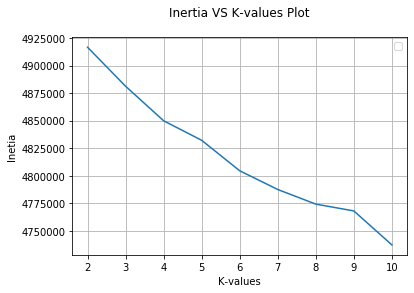

In [12]:
# plotting inertia vs k 
plt.legend()
plt.plot(n_clusters, inertia)
plt.xlabel('K-values')
plt.ylabel('Inetia')
plt.title('Inertia VS K-values Plot\n')
plt.grid()
plt.show()

 <p> Observation: we can see the inflection point at k=9</p>

In [16]:
optimal_K = 9
# KMeans++ with optimal value of K
kmeans_bow = KMeans(n_clusters=optimal_K, init='k-means++').fit(X_bow) 

# adding label for each data point
Dataset['Cluster_label'] = kmeans_bow.labels_

### [5.1.2] Wordclouds of clusters obtained after applying k-means on BOW<font color='red'> SET 1</font>

Word Cloud For Cluster:  0


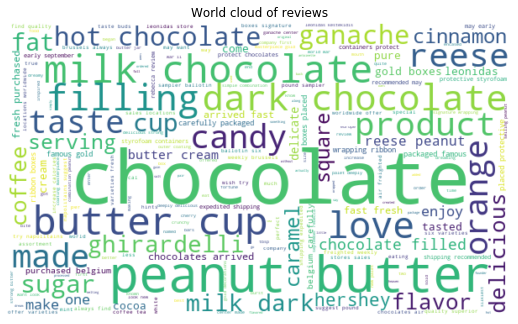

Word Cloud For Cluster:  1


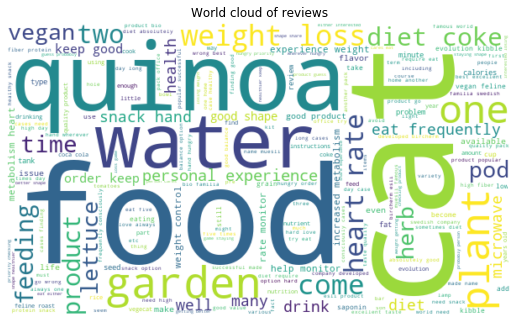

Word Cloud For Cluster:  2


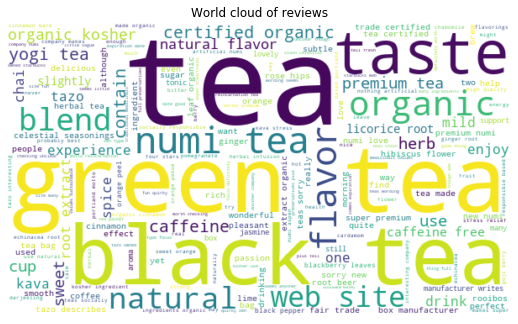

Word Cloud For Cluster:  3


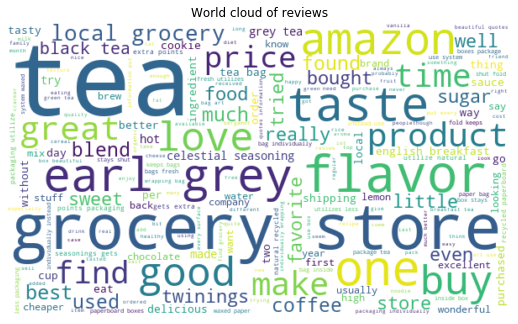

Word Cloud For Cluster:  4


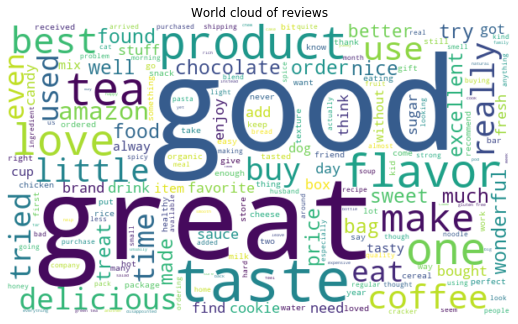

Word Cloud For Cluster:  5


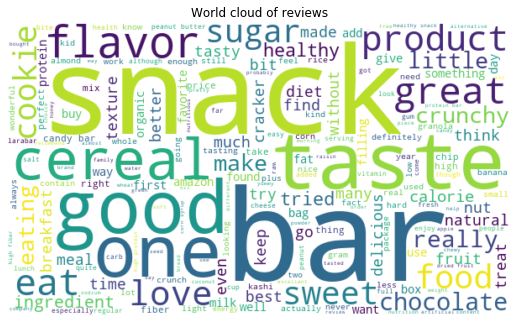

Word Cloud For Cluster:  6


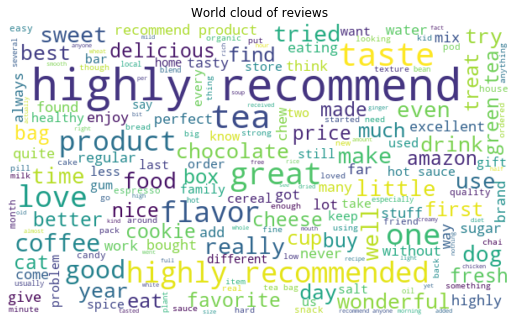

Word Cloud For Cluster:  7


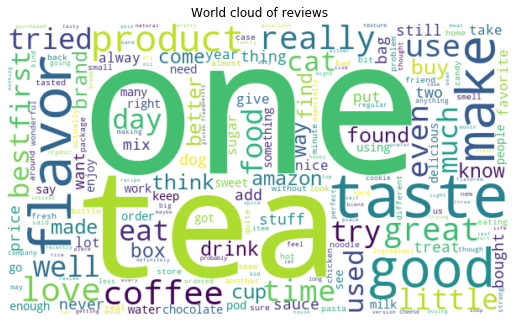

Word Cloud For Cluster:  8


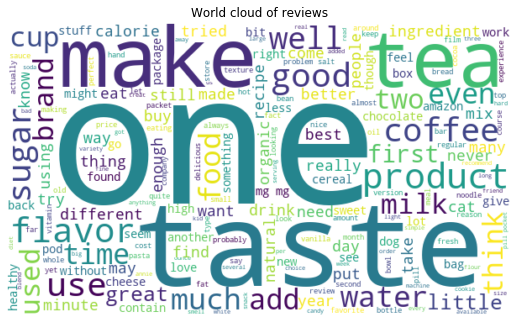

In [17]:
# plotting word cloud for eachcluster
for i in range(kmeans_bow.n_clusters):
    l = []
    label = Dataset.groupby(["Cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(Dataset.loc[label[j]]["Review"])
#         break
    print("Word Cloud For Cluster: ",i)
    plotWordCloud(l)
#     break

## [5.1.3] Applying K-Means Clustering on TFIDF,<font color='red'> SET 2</font>

In [18]:
# Bow vectorization
vectorizer = TfidfVectorizer(ngram_range=(1, 2), max_features=500) 
X_tfidf = vectorizer.fit_transform(X)

# Standardization
std = StandardScaler(with_mean = False)
X_tfidf = std.fit_transform(X_tfidf)

In [19]:
# Model Training
n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]
inertia = []
for k in tqdm(n_clusters):
    model = KMeans(n_clusters=k, init='k-means++').fit(X_tfidf)
    inertia.append(model.inertia_)


100%|██████████| 9/9 [08:27<00:00, 63.07s/it]

No handles with labels found to put in legend.


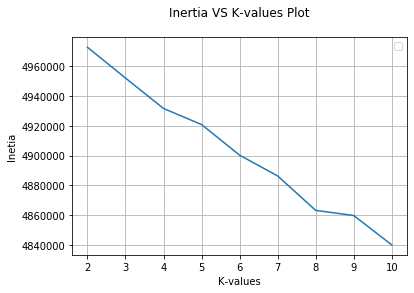

In [20]:
# plotting inertia vs k 
plt.legend()
plt.plot(n_clusters, inertia)
plt.xlabel('K-values')
plt.ylabel('Inetia')
plt.title('Inertia VS K-values Plot\n')
plt.grid()
plt.show()

In [21]:
optimal_K = 8
# KMeans++ with optimal value of K
kmeans_tfidf = KMeans(n_clusters=optimal_K, init='k-means++').fit(X_bow) 

# adding label for each data point
Dataset['Cluster_label'] = kmeans_bow.labels_

### [5.1.4] Wordclouds of clusters obtained after applying k-means on TFIDF<font color='red'> SET 2</font>

Word Cloud For Cluster:  0


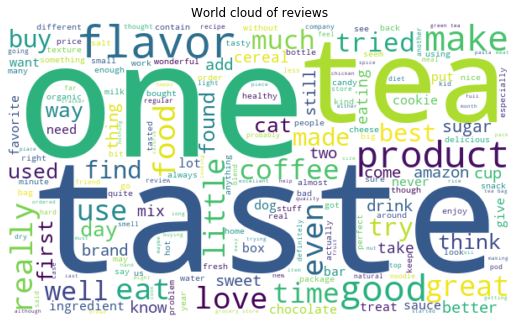

Word Cloud For Cluster:  1


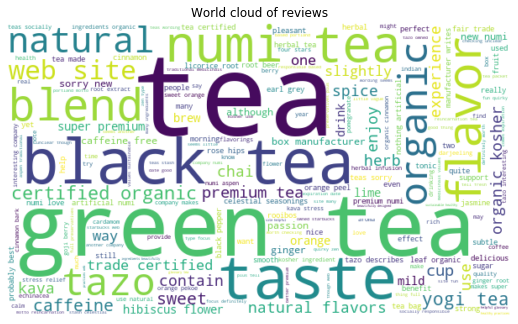

Word Cloud For Cluster:  2


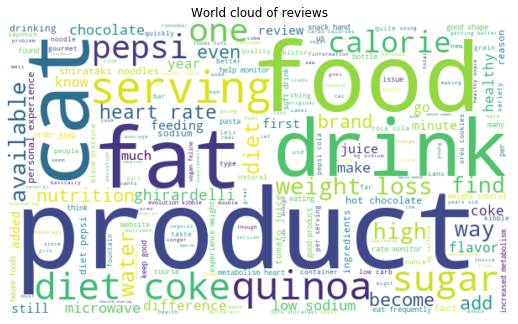

Word Cloud For Cluster:  3


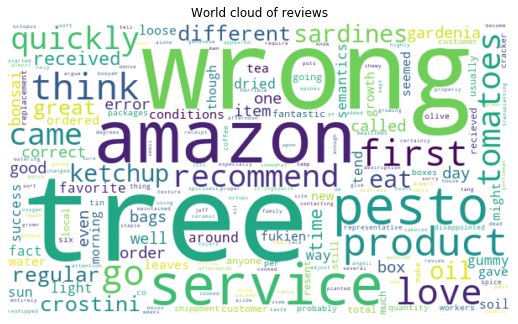

Word Cloud For Cluster:  4


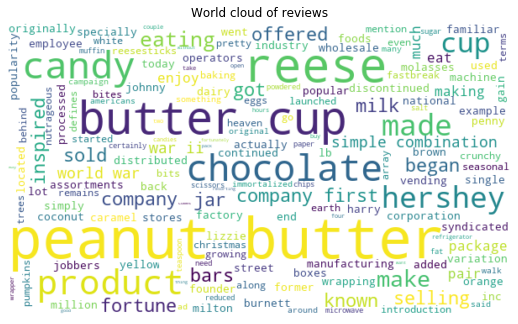

Word Cloud For Cluster:  5


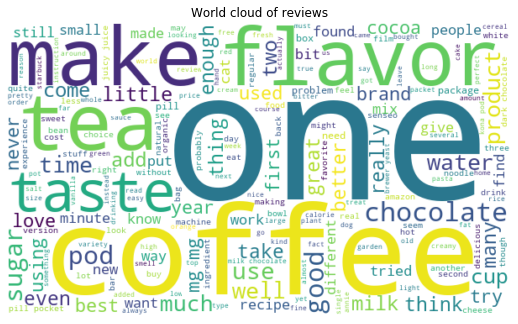

Word Cloud For Cluster:  6


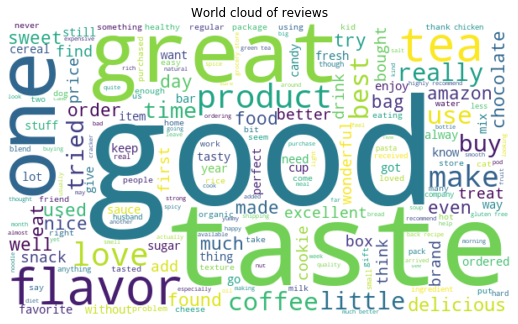

Word Cloud For Cluster:  7


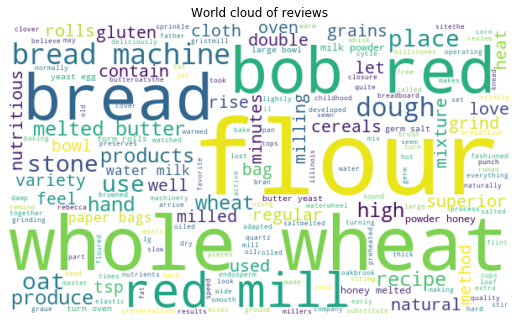

In [22]:
# plotting word cloud for eachcluster
for i in range(kmeans_tfidf.n_clusters):
    l = []
    label = Dataset.groupby(["Cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(Dataset.loc[label[j]]["Review"])
#         break
    print("Word Cloud For Cluster: ",i)
    plotWordCloud(l)
#     break

### [5.1.5] Applying K-Means Clustering on AVG W2V,<font color='red'> SET 3</font>

In [23]:
# Train your own Word2Vec model using your own text corpus
def sentenceSplit(data):
    list_of_sentance=[]
    for sentance in data:
        list_of_sentance.append(sentance.split())
    return list_of_sentance

In [26]:
# this line of code trains your w2v model on the give list of sentances
list_of_sentance_train = sentenceSplit(X)
w2v_model=Word2Vec(list_of_sentance_train,min_count=5,size=150, workers=4)
w2v_words = list(w2v_model.wv.vocab)

In [27]:
def avgW2V(list_of_sentance,W2VModel):
    # average Word2Vec
    # compute average word2vec for each review.
    sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
    for sent in tqdm(list_of_sentance): # for each review/sentence
        sent_vec = np.zeros(150) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
        cnt_words =0; # num of words with a valid vector in the sentence/review
        for word in sent: # for each word in a review/sentence
            if word in W2VModel:
                vec = W2VModel.wv[word]
                sent_vec += vec
                cnt_words += 1
        if cnt_words != 0:
            sent_vec /= cnt_words
        sent_vectors.append(sent_vec)
    return sent_vectors

In [28]:
# W2Vec Vectorization
X_w2v = avgW2V(list_of_sentance_train, w2v_model)

# Standardization
std = StandardScaler(with_mean = False)
X_w2v = std.fit_transform(X_w2v)


100%|██████████| 10000/10000 [00:03<00:00, 2684.16it/s]

In [29]:
# Model Training
n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]
inertia = []
for k in tqdm(n_clusters):
    model = KMeans(n_clusters=k, init='k-means++').fit(X_w2v)
    inertia.append(model.inertia_)


100%|██████████| 9/9 [00:18<00:00,  2.48s/it]

No handles with labels found to put in legend.


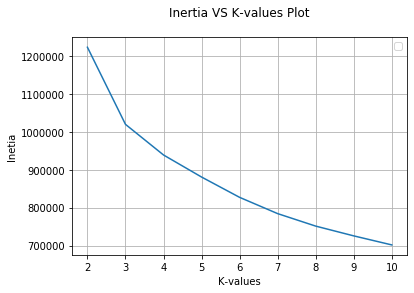

In [30]:
# plotting inertia vs k 
plt.legend()
plt.plot(n_clusters, inertia)
plt.xlabel('K-values')
plt.ylabel('Inetia')
plt.title('Inertia VS K-values Plot\n')
plt.grid()
plt.show()

In [32]:
optimal_K = 7
# KMeans++ with optimal value of K
kmeans_w2v = KMeans(n_clusters=optimal_K, init='k-means++').fit(X_w2v) 

# adding label for each data point
Dataset['Cluster_label'] = kmeans_bow.labels_

### [5.1.6] Wordclouds of clusters obtained after applying k-means on AVG W2V<font color='red'> SET 3</font>

Word Cloud For Cluster:  0


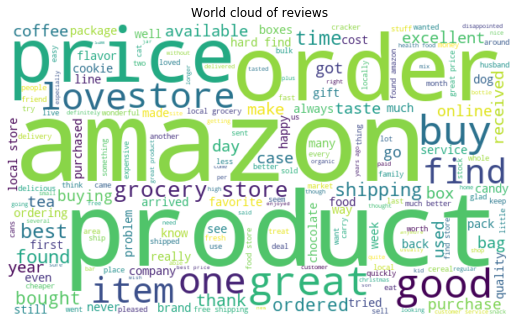

Word Cloud For Cluster:  1


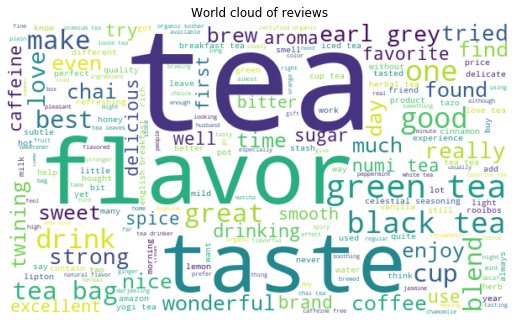

Word Cloud For Cluster:  2


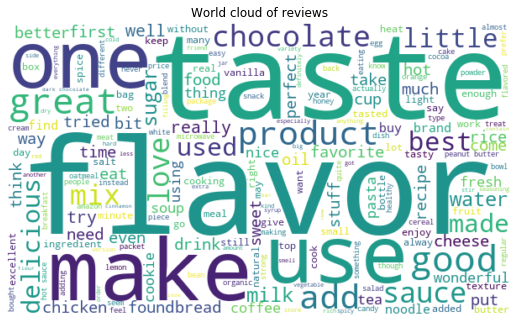

Word Cloud For Cluster:  3


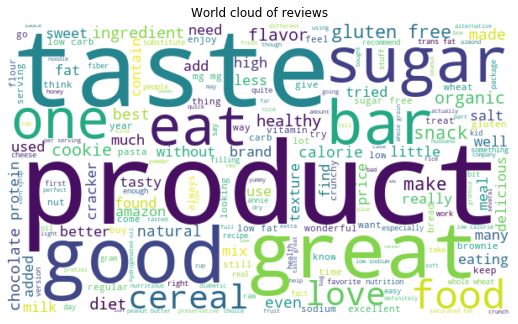

Word Cloud For Cluster:  4


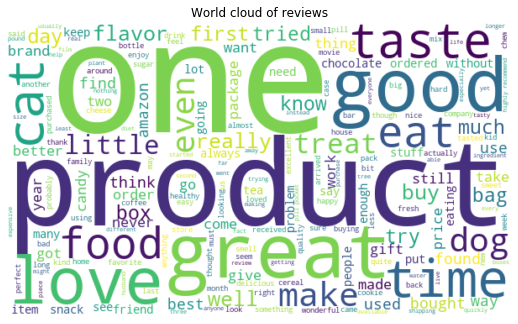

Word Cloud For Cluster:  5


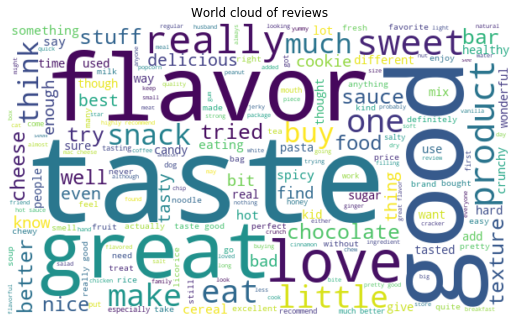

Word Cloud For Cluster:  6


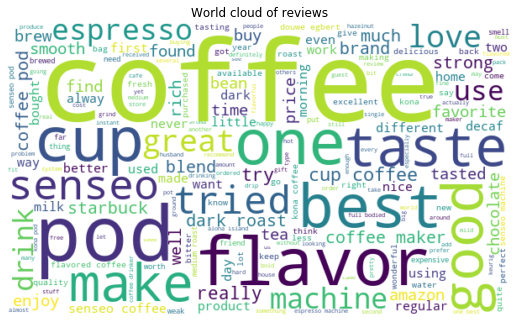

In [33]:
# plotting word cloud for eachcluster
for i in range(kmeans_w2v.n_clusters):
    l = []
    label = Dataset.groupby(["Cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(Dataset.loc[label[j]]["Review"])
#         break
    print("Word Cloud For Cluster: ",i)
    plotWordCloud(l)
#     break

### [5.1.7] Applying K-Means Clustering on TFIDF W2V,<font color='red'> SET 4</font>

In [34]:
# TFIDF Vectorization
vectorizer = TfidfVectorizer(ngram_range=(1, 2), max_features=500) 
X_tfidf_w2v = vectorizer.fit(X)

# List of sentence in X
sent_of_X=[]
for sent in X:
    sent_of_X.append(sent.split())

In [35]:
# TFIDF-Word2Vec
tfidf_feat = vectorizer.get_feature_names()
X_tfidf = vectorizer.transform(X)
X_tfidf_AW2V = []
row=0;
for sent in tqdm(sent_of_X): 
    sent_vec = np.zeros(150) 
    weight_sum =0; 
    for word in sent: 
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
            # obtain the tf_idfidf of a word in a sentence/review
            tf_idf = X_tfidf[row, tfidf_feat.index(word)]
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    X_tfidf_AW2V.append(sent_vec)
    row += 1


100%|██████████| 10000/10000 [00:19<00:00, 520.10it/s]

In [36]:
# Standardization
std = StandardScaler(with_mean = False)
X_tfidf_AW2V = std.fit_transform(X_tfidf_AW2V)

In [37]:
# Model Training
n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]
inertia = []
for k in tqdm(n_clusters):
    model = KMeans(n_clusters=k, init='k-means++').fit(X_tfidf_AW2V)
    inertia.append(model.inertia_)


100%|██████████| 9/9 [00:18<00:00,  2.47s/it]

No handles with labels found to put in legend.


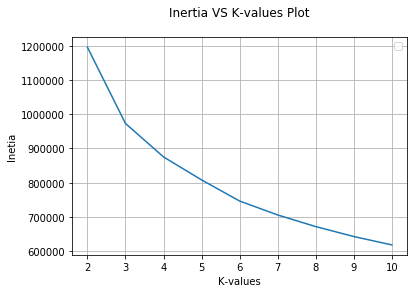

In [38]:
# plotting inertia vs k 
plt.legend()
plt.plot(n_clusters, inertia)
plt.xlabel('K-values')
plt.ylabel('Inetia')
plt.title('Inertia VS K-values Plot\n')
plt.grid()
plt.show()

In [39]:
optimal_K = 6
# KMeans++ with optimal value of K
kmeans_tfidf_w2v = KMeans(n_clusters=optimal_K, init='k-means++').fit(X_tfidf_AW2V) 

# adding label for each data point
Dataset['Cluster_label'] = kmeans_bow.labels_

### [5.1.8] Wordclouds of clusters obtained after applying k-means on TFIDF W2V<font color='red'> SET 4</font>

Word Cloud For Cluster:  0


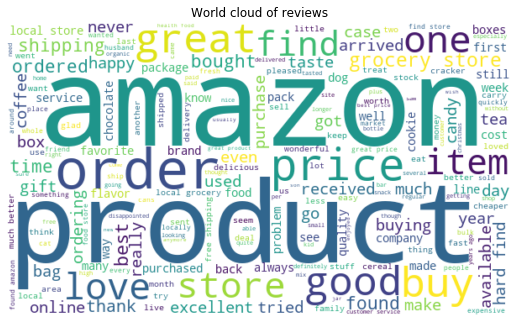

Word Cloud For Cluster:  1


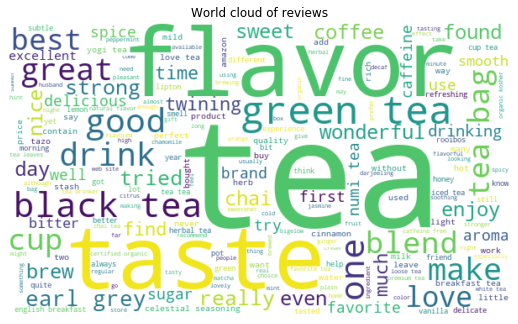

Word Cloud For Cluster:  2


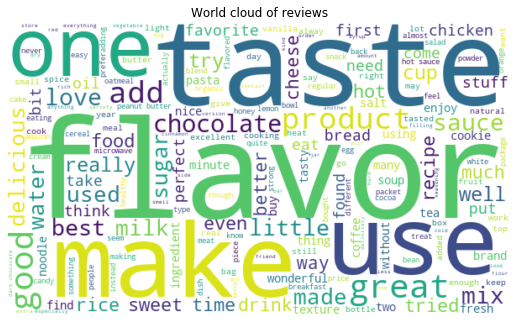

Word Cloud For Cluster:  3


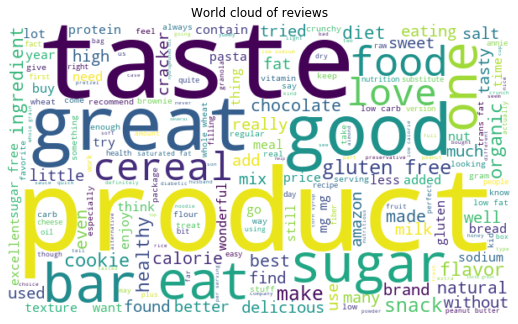

Word Cloud For Cluster:  4


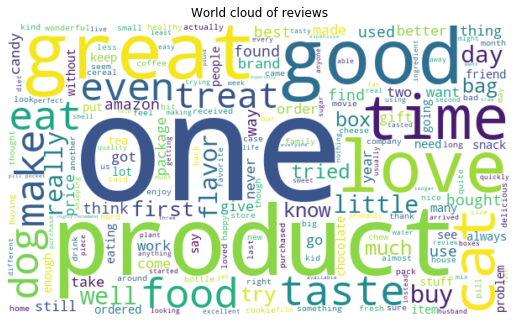

Word Cloud For Cluster:  5


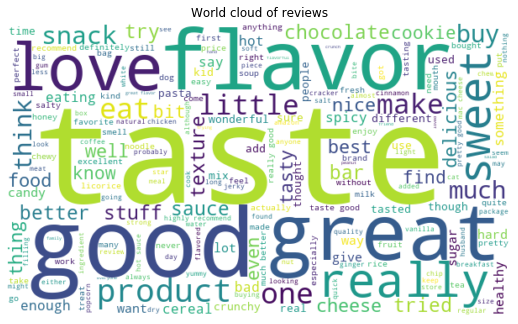

In [40]:
# plotting word cloud for eachcluster
for i in range(kmeans_tfidf_w2v.n_clusters):
    l = []
    label = Dataset.groupby(["Cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(Dataset.loc[label[j]]["Review"])
#         break
    print("Word Cloud For Cluster: ",i)
    plotWordCloud(l)
#     break

# [5.2] Agglomerative Clustering

In [17]:
from sklearn.cluster import AgglomerativeClustering

In [18]:
# Dataframe with review length as extra feature
Dataset = pd.DataFrame(
    {'Review': preprocessed_reviews[:10000],
     'Score' : reviewDF['Score'][:10000]
     
    })
X = Dataset.iloc[:,:2].values
X = np.array(X[:,:1])
X = X.reshape(X.shape[0],)
# X=X[:1000]

In [19]:
# Train your own Word2Vec model using your own text corpus
def sentenceSplit(data):
    list_of_sentance=[]
    for sentance in data:
        list_of_sentance.append(sentance.split())
    return list_of_sentance

In [20]:
# this line of code trains your w2v model on the give list of sentances
list_of_sentance_train = sentenceSplit(X)
w2v_model=Word2Vec(list_of_sentance_train,min_count=5,size=150, workers=4)
w2v_words = list(w2v_model.wv.vocab)

In [21]:
def avgW2V(list_of_sentance,W2VModel):
    # average Word2Vec
    # compute average word2vec for each review.
    sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
    for sent in tqdm(list_of_sentance): # for each review/sentence
        sent_vec = np.zeros(150) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
        cnt_words =0; # num of words with a valid vector in the sentence/review
        for word in sent: # for each word in a review/sentence
            if word in W2VModel:
                vec = W2VModel.wv[word]
                sent_vec += vec
                cnt_words += 1
        if cnt_words != 0:
            sent_vec /= cnt_words
        sent_vectors.append(sent_vec)
    return sent_vectors

### [5.2.1] Applying Agglomerative Clustering on AVG W2V,<font color='red'> SET 3</font>

In [22]:
# W2Vec Vectorization
X_w2v = avgW2V(list_of_sentance_train, w2v_model)

# Standardization
std = StandardScaler(with_mean = False)
X_w2v = std.fit_transform(X_w2v)

100%|██████████| 10000/10000 [00:03<00:00, 3207.82it/s]


### [5.2.2] Wordclouds of clusters obtained after applying Agglomerative Clustering on AVG W2V<font color='red'> SET 3</font>

Hierarchical Clustering with K=2 and 10000 datapoints
Word Cloud For Cluster:  0


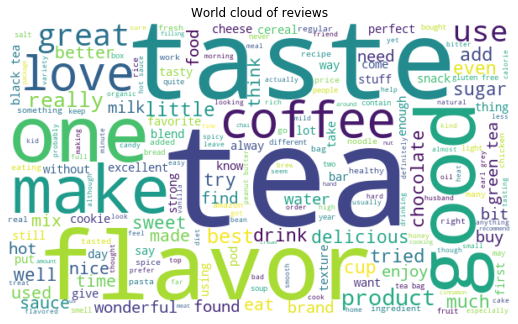

Word Cloud For Cluster:  1


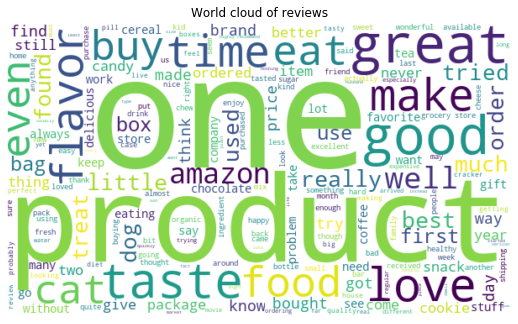

In [24]:
# Word cloud with 2 clusters
model = AgglomerativeClustering(n_clusters=2).fit(X_w2v)
# adding label for each data point
Dataset['Cluster_label'] = model.labels_

print("Hierarchical Clustering with K=2 and 10000 datapoints")
# plotting word cloud for eachcluster
for i in range(model.n_clusters):
    l = []
    label = Dataset.groupby(["Cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(Dataset.loc[label[j]]["Review"])
#         break
    print("Word Cloud For Cluster: ",i)
    plotWordCloud(l)
#     break

#### Observation(s):
    - The first cluster have reviews related to beverages with positive sentiments towards the products, as it      contains the words like Tea, Coffee milk etc.
    - Second cluster seems to have mixed reviews. 

Hierarchical Clustering with K=4 and 10000 datapoints
Word Cloud For Cluster:  0


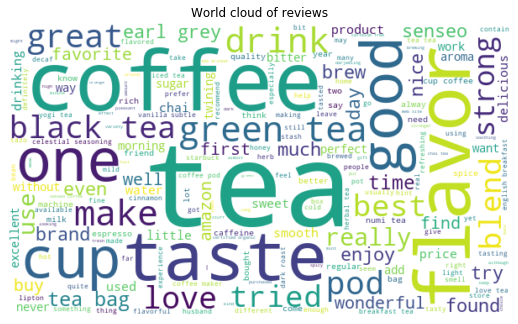

Word Cloud For Cluster:  1


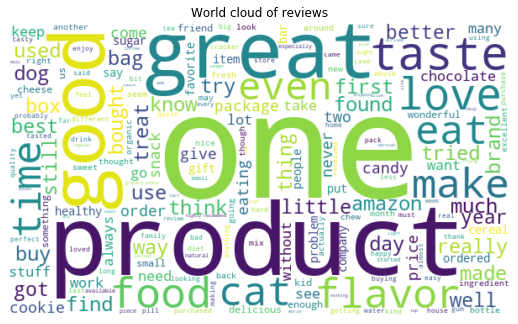

Word Cloud For Cluster:  2


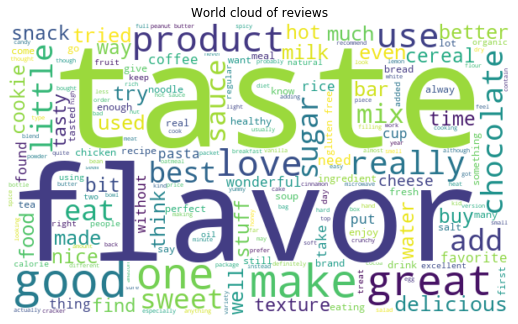

Word Cloud For Cluster:  3


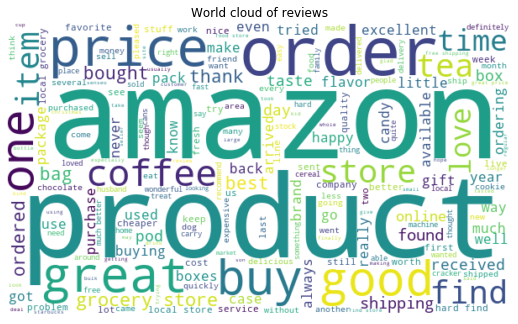

In [25]:
# Word cloud with 4 clusters
model = AgglomerativeClustering(n_clusters=4).fit(X_w2v)
# adding label for each data point
Dataset['Cluster_label'] = model.labels_

print("Hierarchical Clustering with K=4 and 10000 datapoints")
# plotting word cloud for eachcluster
for i in range(model.n_clusters):
    l = []
    label = Dataset.groupby(["Cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(Dataset.loc[label[j]]["Review"])
#         break
    print("Word Cloud For Cluster: ",i)
    plotWordCloud(l)
#     break

#### Observation(s):
    - Here also the first cluster is about drinks indicating positive sentiments towards the products.
    - where as 2nd and 3rd cluster indicate positive sentiments towards various products.
    - 4th cluster have mixed words, making it hard to draw any conclusion.

### [5.2.3] Applying Agglomerative Clustering on TFIDF W2V,<font color='red'> SET 4</font>

In [26]:
# TFIDF Vectorization
vectorizer = TfidfVectorizer(ngram_range=(1, 2), max_features=1000) 
X_tfidf_w2v = vectorizer.fit(X)

# List of sentence in X
sent_of_X=[]
for sent in X:
    sent_of_X.append(sent.split())

In [27]:
# TFIDF-Word2Vec
tfidf_feat = vectorizer.get_feature_names()
X_tfidf = vectorizer.transform(X)
X_tfidf_AW2V = []
row=0;
for sent in tqdm(sent_of_X): 
    sent_vec = np.zeros(150) 
    weight_sum =0; 
    for word in sent: 
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
            # obtain the tf_idfidf of a word in a sentence/review
            tf_idf = X_tfidf[row, tfidf_feat.index(word)]
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    X_tfidf_AW2V.append(sent_vec)
    row += 1

100%|██████████| 10000/10000 [00:23<00:00, 421.40it/s]


In [28]:
# Standardization
std = StandardScaler(with_mean = False)
X_tfidf_AW2V = std.fit_transform(X_tfidf_AW2V)

### [5.2.4] Wordclouds of clusters obtained after applying Agglomerative Clustering on TFIDF W2V<font color='red'> SET 4</font>

Hierarchical Clustering with K=4 and 10000 datapoints
Word Cloud For Cluster:  0


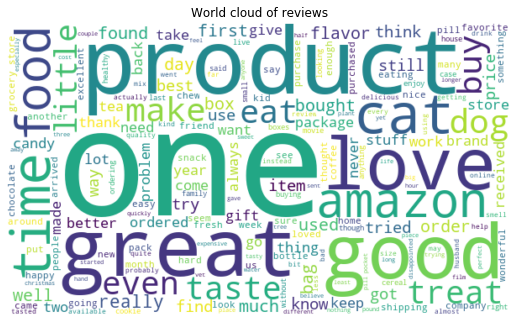

Word Cloud For Cluster:  1


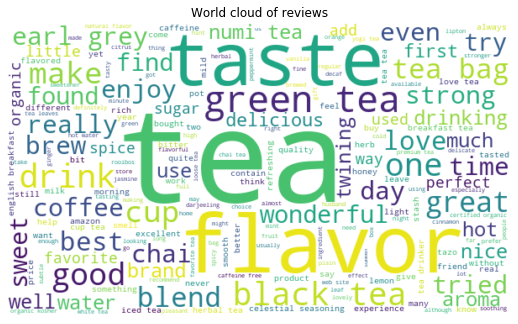

Word Cloud For Cluster:  2


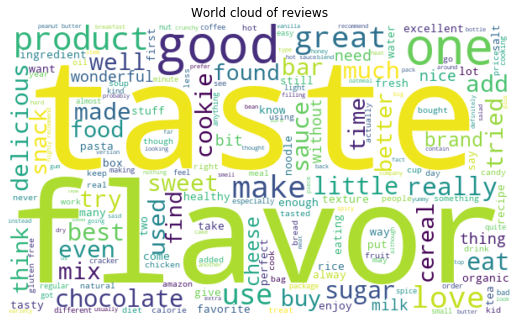

Word Cloud For Cluster:  3


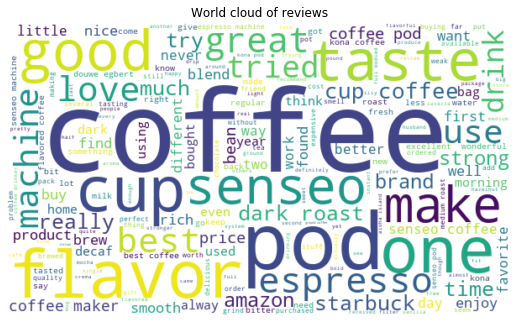

In [30]:
# Model Training
model = AgglomerativeClustering(n_clusters=4).fit(X_tfidf_AW2V)
# adding label for each data point
Dataset['Cluster_label'] = model.labels_

print("Hierarchical Clustering with K=4 and 10000 datapoints")
# plotting word cloud for eachcluster
for i in range(model.n_clusters):
    l = []
    label = Dataset.groupby(["Cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(Dataset.loc[label[j]]["Review"])
#         break
    print("Word Cloud For Cluster: ",i)
    plotWordCloud(l)
#     break

Hierarchical Clustering with K=2 and 10000 datapoints
Word Cloud For Cluster:  0


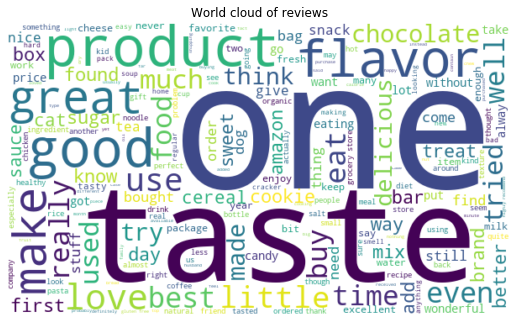

Word Cloud For Cluster:  1


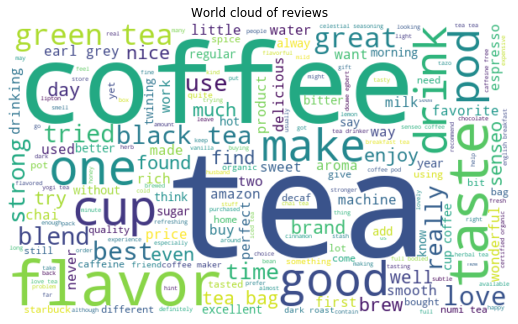

In [29]:
# Model Training
model = AgglomerativeClustering(n_clusters=2).fit(X_tfidf_AW2V)
# adding label for each data point
Dataset['Cluster_label'] = model.labels_

print("Hierarchical Clustering with K=2 and 10000 datapoints")
# plotting word cloud for eachcluster
for i in range(model.n_clusters):
    l = []
    label = Dataset.groupby(["Cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(Dataset.loc[label[j]]["Review"])
#         break
    print("Word Cloud For Cluster: ",i)
    plotWordCloud(l)
#     break

#### Observation(s):
    - 1st cluster shows positive sentiments towards the products.
    - 2nd cluster is of beverages with positive sentiments.

# [5.3] DBSCAN Clustering

In [32]:
from sklearn.cluster import DBSCAN

### [5.3.1] Applying DBSCAN on AVG W2V,<font color='red'> SET 3</font>

In [33]:
# Train your own Word2Vec model using your own text corpus
def sentenceSplit(data):
    list_of_sentance=[]
    for sentance in data:
        list_of_sentance.append(sentance.split())
    return list_of_sentance

In [34]:
# this line of code trains your w2v model on the give list of sentances
list_of_sentance_train = sentenceSplit(X)
w2v_model=Word2Vec(list_of_sentance_train,min_count=5,size=150, workers=4)
w2v_words = list(w2v_model.wv.vocab)

In [35]:
def avgW2V(list_of_sentance,W2VModel):
    # average Word2Vec
    # compute average word2vec for each review.
    sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
    for sent in tqdm(list_of_sentance): # for each review/sentence
        sent_vec = np.zeros(150) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
        cnt_words =0; # num of words with a valid vector in the sentence/review
        for word in sent: # for each word in a review/sentence
            if word in W2VModel:
                vec = W2VModel.wv[word]
                sent_vec += vec
                cnt_words += 1
        if cnt_words != 0:
            sent_vec /= cnt_words
        sent_vectors.append(sent_vec)
    return sent_vectors

In [36]:
# W2Vec Vectorization
X_w2v = avgW2V(list_of_sentance_train, w2v_model)

# Standardization
std = StandardScaler(with_mean = False)
X_w2v = std.fit_transform(X_w2v)

100%|██████████| 10000/10000 [00:02<00:00, 3421.82it/s]


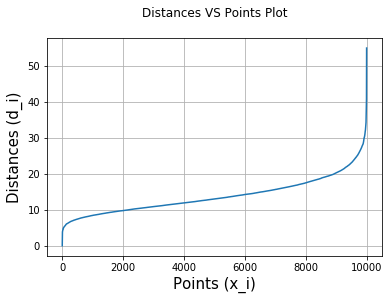

In [46]:
minPts = 2*X_w2v.shape[1]

# distance of each point from its nth nearest neighbour
distance = np.sqrt([np.sort(np.sum((X_w2v-v)**2,axis=1),axis=None) for v in X_w2v][minPts])
points = [i for i in range(X_w2v.shape[0])]

# Draw distances(d_i) VS points(x_i) plot
plt.plot(points, distance)
plt.xlabel('Points (x_i)',size=15)
plt.ylabel('Distances (d_i)',size=15)
plt.title('Distances VS Points Plot\n',size=12)
plt.grid()
plt.show()

    - From the graph we can see that di increases rapidly after di = 23

In [39]:
# Model Training
opt_eps = 23
model = DBSCAN(eps=opt_eps, min_samples=minPts).fit(X_w2v)
# adding label for each data point
labels = model.labels_
Dataset['Cluster_label'] = labels

In [40]:
# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

core_samples_mask = np.zeros_like(model.labels_, dtype=bool)
core_samples_mask[model.core_sample_indices_] = True

In [44]:
n_clusters_, n_noise_

(1, 1)

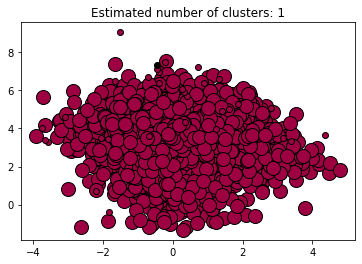

In [45]:
# DBSCAN cluster visualization
# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]

for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X_w2v[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)

    xy = X_w2v[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=6)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

### [5.3.2] Wordclouds of clusters obtained after applying DBSCAN on AVG W2V<font color='red'> SET 3</font>

Word Cloud For Cluster:  0


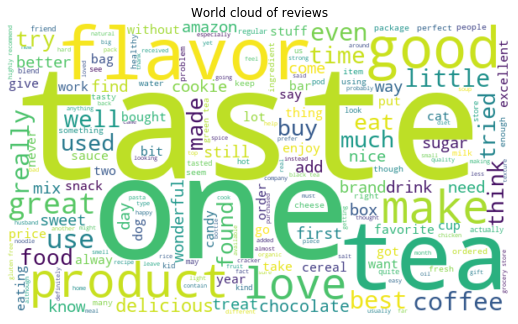

In [47]:
# plotting word cloud for eachcluster
for i in range(n_clusters_):
    l = []
    label = Dataset.groupby(["Cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(Dataset.loc[label[j]]["Review"])
#         break
    print("Word Cloud For Cluster: ",i)
    plotWordCloud(l)
#     break

### [5.3.3] Applying DBSCAN on TFIDF W2V,<font color='red'> SET 4</font>

In [57]:
# TFIDF Vectorization
vectorizer = TfidfVectorizer(ngram_range=(1, 2), max_features=1000) 
X_tfidf_w2v = vectorizer.fit(X)

# List of sentence in X
sent_of_X=[]
for sent in X:
    sent_of_X.append(sent.split())

In [58]:
# TFIDF-Word2Vec
tfidf_feat = vectorizer.get_feature_names()
X_tfidf = vectorizer.transform(X)
X_tfidf_AW2V = []
row=0;
for sent in tqdm(sent_of_X): 
    sent_vec = np.zeros(150) 
    weight_sum =0; 
    for word in sent: 
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
            # obtain the tf_idfidf of a word in a sentence/review
            tf_idf = X_tfidf[row, tfidf_feat.index(word)]
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    X_tfidf_AW2V.append(sent_vec)
    row += 1

100%|██████████| 10000/10000 [00:36<00:00, 276.87it/s]


In [59]:
# Standardization
std = StandardScaler(with_mean = False)
X_tfidf_AW2V = std.fit_transform(X_tfidf_AW2V)

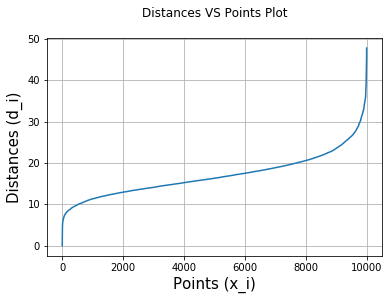

In [61]:
# Hyperparameter tuning
minPts = 2*X_tfidf_AW2V.shape[1]

# distance of each point from its nth nearest neighbour
distance = np.sqrt([np.sort(np.sum((X_tfidf_AW2V-v)**2,axis=1),axis=None) for v in X_tfidf_AW2V][minPts])
points = [i for i in range(X_tfidf_AW2V.shape[0])]

# Draw distances(d_i) VS points(x_i) plot
plt.plot(points, distance)
plt.xlabel('Points (x_i)',size=15)
plt.ylabel('Distances (d_i)',size=15)
plt.title('Distances VS Points Plot\n',size=12)
plt.grid()
plt.show()

    - From the graph we can see that di increases rapidly after di = 25

In [62]:
# Model Training
opt_eps = 25
model = DBSCAN(eps=opt_eps, min_samples=minPts).fit(X_tfidf_AW2V)
# adding label for each data point
labels = model.labels_
Dataset['Cluster_label'] = labels

In [63]:
# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

core_samples_mask = np.zeros_like(model.labels_, dtype=bool)
core_samples_mask[model.core_sample_indices_] = True

In [64]:
n_clusters_,n_noise_

(1, 0)

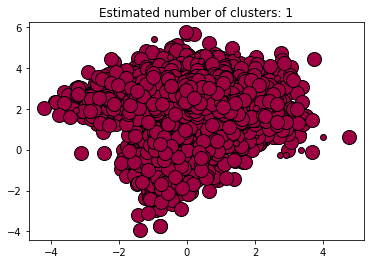

In [65]:
# DBSCAN cluster visualization
# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]

for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X_tfidf_AW2V[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)

    xy = X_tfidf_AW2V[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=6)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

### [5.3.4] Wordclouds of clusters obtained after applying DBSCAN on TFIDF W2V<font color='red'> SET 4</font>

Word Cloud For Cluster:  0


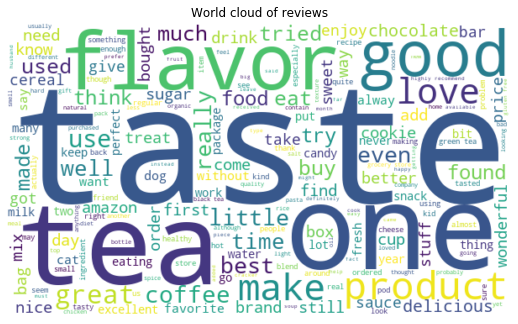

In [66]:
# plotting word cloud for eachcluster
for i in range(n_clusters_):
    l = []
    label = Dataset.groupby(["Cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(Dataset.loc[label[j]]["Review"])
#         break
    print("Word Cloud For Cluster: ",i)
    plotWordCloud(l)
#     break

### Observation(s):
    - From the cluster plot we can see that for both the vectorizer a single desnse cluster is formed.
    - AS the dataset contain around 88% of positive reviews, due to this We can see that the clusters seems to     have more positive words.

# [6] Conclusions

### KMean

In [68]:
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Vectorizer", "Model", "Hyperparameter: K"]
x.add_row(["BOW", "KMean", 9])
x.add_row(["TFIDF", "KMean",8 ])
x.add_row(["Average W2v","KMean",7 ])
x.add_row(["TFIDF-W2v", "KMean", 6])
print(x)

+-------------+-------+-------------------+
|  Vectorizer | Model | Hyperparameter: K |
+-------------+-------+-------------------+
|     BOW     | KMean |         9         |
|    TFIDF    | KMean |         8         |
| Average W2v | KMean |         7         |
|  TFIDF-W2v  | KMean |         6         |
+-------------+-------+-------------------+


### Agglomarative

In [69]:
x = PrettyTable()
x.field_names = ["Vectorizer", "Model", "n_cluster"]
x.add_row(["Average W2v","Aglomarative","2, 4"])
x.add_row(["TFIDF-W2v", "Aglomarative", "2, 4"])
print(x)

+-------------+--------------+-----------+
|  Vectorizer |    Model     | n_cluster |
+-------------+--------------+-----------+
| Average W2v | Aglomarative |    2, 4   |
|  TFIDF-W2v  | Aglomarative |    2, 4   |
+-------------+--------------+-----------+


### DBSCAN

In [74]:
x = PrettyTable()
x.field_names = ["Vectorizer", "Model", "Hyperparameter: eps, minPts"]
x.add_row(["Average W2v","DBSCAN", "300,23"])
x.add_row(["TFIDF-W2v", "DBSCAN",  "300,25"])
print(x)

+-------------+--------+-----------------------------+
|  Vectorizer | Model  | Hyperparameter: eps, minPts |
+-------------+--------+-----------------------------+
| Average W2v | DBSCAN |            300,23           |
|  TFIDF-W2v  | DBSCAN |            300,25           |
+-------------+--------+-----------------------------+
